In [1]:
# unzip file
#!unzip "/content/drive/MyDrive/ml-course/dog_vision/data/train.zip" -d "/content/drive/MyDrive/ml-course/dog_vision/data/train"
#!unzip "/content/drive/MyDrive/ml-course/dog_vision/data/test.zip" -d "/content/drive/MyDrive/ml-course/dog_vision/data/test"


# 🐩 End to end Multi-class Dof breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data?select=test

## 3. Evaluation

The evaluation is a file prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this mean there are 120 different classes.)
* There around 10,000+ images in the training set. (These images have labels.)
* There around 10,000+ images in the test set. (These images don't have labels, because we'll want to predict them).


## Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅
* 

In [2]:
# Import neccessary tools
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "is using" if tf.config.list_physical_devices("GPU")
                                  else "not available")

TF version: 2.11.0
TF Hub version: 0.12.0
GPU is using


# Getting our data ready (turning into Tensor)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [119]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
# Check out the labels of our data
labels_csv = pd.read_csv("drive/MyDrive/ml-course/dog_vision/data/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<AxesSubplot:>

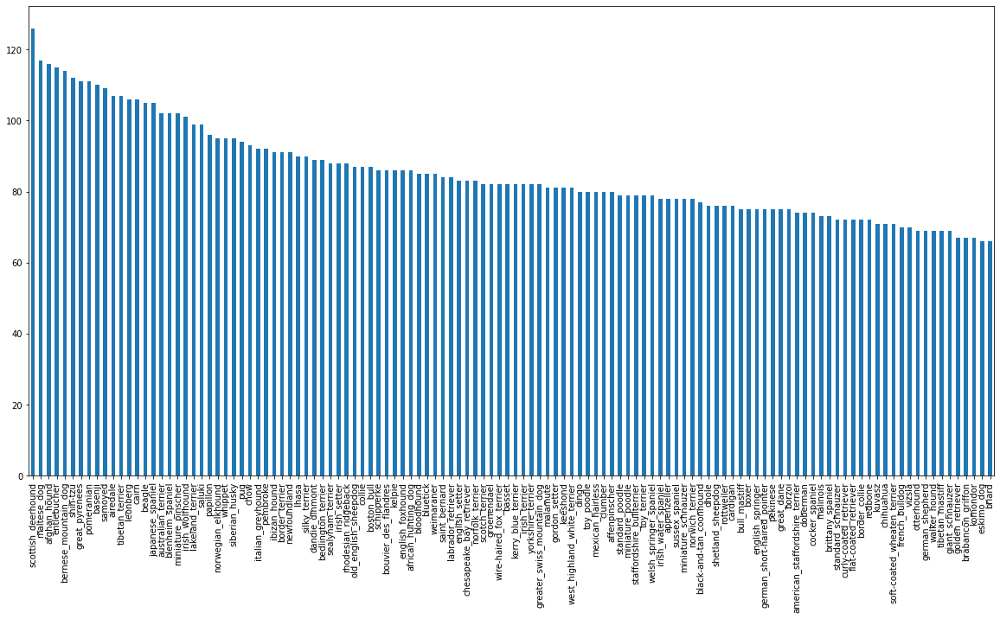

In [5]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv.breed.value_counts().median()

82.0

In [7]:
# Let's view an image
from IPython.display import Image
import os

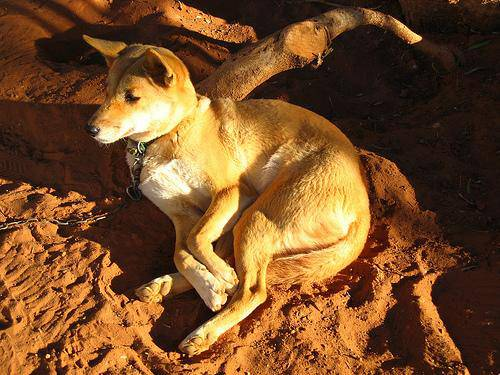

In [8]:
train_dir = "drive/MyDrive/ml-course/dog_vision/data/train/"
test_dir ="drive/MyDrive/ml-course/dog_vision/data/test/"
file_extension = "jpg"
image_path = train_dir + "001513dfcb2ffafc82cccf4d8bbaba97" + "." + file_extension

Image(data= image_path)

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [9]:
# Create pathnames from image ID's
filenames = [train_dir + fname + "." + file_extension
             for fname in labels_csv["id"]]

# check the first 10
filenames[:10]

['drive/MyDrive/ml-course/dog_vision/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/ml-course/dog_vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/ml-course/dog_vision/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/ml-course/dog_vision/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/ml-course/dog_vision/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/ml-course/dog_vision/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/ml-course/dog_vision/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/ml-course/dog_vision/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/ml-course/dog_vision/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/ml-course/dog_vision/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
os.listdir(train_dir)[:10]

['e75f2316c5dd47b87a22bbe95cf8b8da.jpg',
 'e74d4ff0bbbaed7ed27b0dc3a27aadb1.jpg',
 'e7c5692d044250d303a839d989132bf1.jpg',
 'e6cdf82e11fd0ee6f73c55c0b4944616.jpg',
 'e79a5176fe0322a36d09f057d64aec54.jpg',
 'e6eb11571ef963fac4d2300df3122f85.jpg',
 'e7a8a3681524405b2e987ffbaff6d173.jpg',
 'e77a27e8f24034facbfae4b2dffd476b.jpg',
 'e76ab0b6cd07a1583ef84a2d4dc98aca.jpg',
 'e7f3274adaad369068602a422e9df192.jpg']

In [11]:
# Check whether number of filenames matches number of actual image files
if len(os.listdir(train_dir)) == len(filenames):
  print("Filenames match actual amount of files!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files!! Proceed.


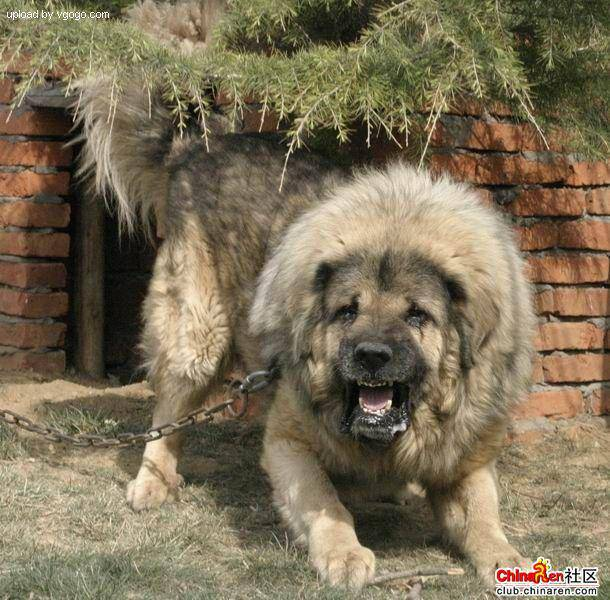

In [12]:
# One more check
Image(filenames[9000])

In [13]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [14]:
labels = labels_csv["breed"].to_numpy()
# labels= np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# Example: turning boolean array into integers
# print(labels[0]) # original label
# print(np.where(unique_breeds == labels[0])) # index where label occurs
# print(boolean_labels[0].argmax()) # index where label occurs in boolean array
# print(boolean_labels[0].astype(int)) # There will be a 1 where sample label occurs

In [17]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames.")
else:
  print("Number of labels does not match number of filenames, check data directories.")
  

Number of labels matches number of filenames.


In [18]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)


120

In [19]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
len(boolean_labels)

10222

### Creating our own valiation set
Since the dataset from kaggle doesn't come with a validation set, we're going to create our own.

In [22]:
# Setup X, y variables
X = filenames
y= boolean_labels

len(filenames), len(boolean_labels)


(10222, 10222)

We're going to start off experimenting with ~ 1000 images and increase as needed.

In [23]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [24]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], 
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [25]:
# Let's have  ageez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/ml-course/dog_vision/data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/ml-course/dog_vision/data/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/ml-course/dog_vision/data/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/ml-course/dog_vision/data/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/ml-course/dog_vision/data/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fals

## Preprocessing Images (Turning image into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable `image`
3. Turn or `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (244,244)
6. Return the modified `image`

Load image Tensorflow:
https://www.tensorflow.org/tutorials/load_data/images

Befor we do, let'see what importing an image looks like.

In [26]:
# Convert image to Numpy array
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [27]:
image.max(), image.min()

(255, 0)

In [28]:
# turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now, we've seen what an image looks like as a Tensor, Let's make a function to preprocess them.
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable `image`
3. Turn or `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (244,244)
6. Return the modified `image`

In [29]:
# Define image size
IMG_SIZE =224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (244,244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image



## Turning our data into batches

Why turn our data into batches?

let's say you're trying process 10,000+ images in one go... They all might not fit into memory.

So that's why we do about 32 (batch size) images at a time. (You can manually adjust the batch size if need be.)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`



In [30]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, 
  processes the image and returns a type of (image, tuple)
  """
  image = process_image(image_path)
  return image, label


In [31]:
#Demo of the function
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now, we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (X & y) into batches

In [32]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, 
                        batch_size = BATCH_SIZE, 
                        valid_data=False, 
                        test_data=False):

  """
  Create batches of data our of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no label)
  """
  # If the data is a test dataset, we probably don't have label.
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepath (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is valid dataset, we don't need to shuffle it.
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),# filepath
                                                          tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf. constant(y)))
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffing images
    data = data.shuffle(buffer_size=len(X))
    
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch


In [33]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [34]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand/ comprehend, let's visualize

In [35]:
# Create function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Display a plot of 25 images and their labels from a data batch.
  """

  # Setup the figure
  plt.figure(figsize=(10,10))
  # loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots(5 rows, 5 cols)
    ax = plt.subplot(5,5, i + 1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


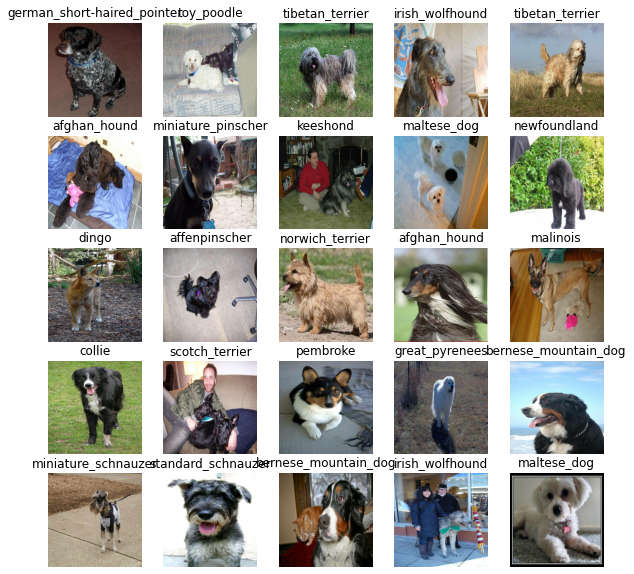

In [36]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

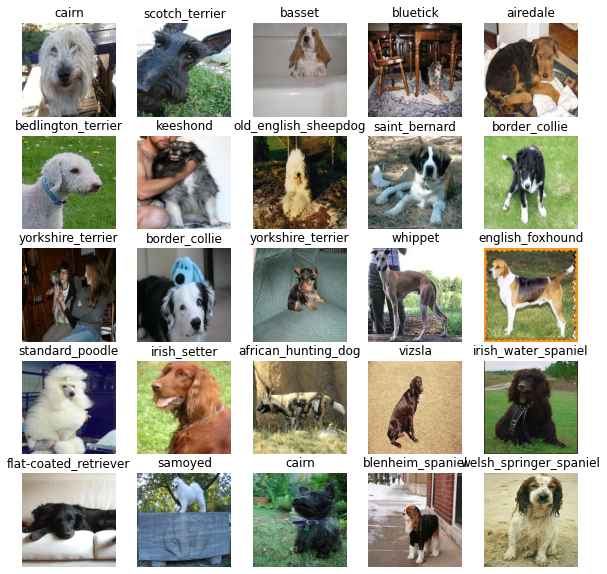

In [37]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use fom TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [38]:
# Setup input shape to the model.
INPUT_SHAPE =[None, IMG_SIZE,IMG_SIZE,3] # Batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


Now, we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in squential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model.

All of steps acn be found here: https://www.tensorflow.org/guide/keras/sequential_model

In [39]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  #Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [40]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper function model can use during training to do such thing as save its progress, check its progress or stop training early if a model stops improving.

We'll create a callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.



### TensorBoard Callback
To setup TensorBoard Callback, we need to do 3 things:
1. Load TensorBoard notebook extension ✅
2. Create TensorBoard Callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualize our models training logs with the `%tensorboard` magic function. (We'll do this after model training) ✅

In [41]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [42]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  # Make it so the logs get tracked whenever we run an experinment
  logdir = os.path.join("drive/MyDrive/ml-course/dog_vision/log",datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(log_dir=logdir)

#### Prevent Overfitting - (Early Stopping callback)

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [43]:
# Create early stopping callback

early_stopping= tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience = 3)

## Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.



In [44]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

In [45]:
# check to make sure we're still running a GPU
print("GPU", "is using" if tf.config.list_physical_devices("GPU")
                                  else "not available")

GPU is using


Let's create a function which trains a model 

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for `(NUM_EPOCHS)` and the callbacks we'd like to use.
* Return the model

In [46]:
# Buil a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model


In [47]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 166s 4s/step - loss: 4.5958 - accuracy: 0.0862 - val_loss: 3.3652 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 163ms/step - loss: 1.6517 - accuracy: 0.6888 - val_loss: 2.1508 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 7s 289ms/step - loss: 0.5702 - accuracy: 0.9400 - val_loss: 1.6606 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 7s 286ms/step - loss: 0.2516 - accuracy: 0.9887 - val_loss: 1.4548 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 7s 274ms/step - loss: 0.1446 - accuracy: 0.9975 - val_loss: 1.3927 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 4s 145ms/step - loss: 0.1001 - accuracy: 1.0000 - val_loss: 1.3522 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================]

**Question:**
It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!

### Checking the Tensorboard logs

The TensorBoard function `(%tensorboard)` will access the logs directory we created earlier and visualize it contents

In [48]:
%tensorboard --logdir drive/MyDrive/ml-course/dog_vision/log

<IPython.core.display.Javascript object>

## Making and Evaluating predictions using a trained model

In [49]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [50]:
# Make predictions on the valiadtion data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 92ms/step


array([[3.2676547e-03, 7.6722070e-05, 1.0343674e-03, ..., 4.6503742e-04,
        1.8757879e-04, 3.1011496e-03],
       [1.3480430e-02, 1.6890715e-03, 6.9811582e-03, ..., 3.2678072e-04,
        5.4450519e-03, 3.5816737e-04],
       [4.2144640e-04, 1.9436869e-04, 4.3457418e-05, ..., 5.0842442e-05,
        1.8668329e-04, 8.0012938e-04],
       ...,
       [2.3667224e-06, 7.4647018e-05, 3.6817642e-06, ..., 8.7071548e-06,
        1.8971140e-04, 2.2905506e-04],
       [3.8102269e-03, 1.5320079e-04, 1.0525379e-04, ..., 5.4722535e-04,
        1.5360776e-04, 3.7150085e-03],
       [7.2515174e-04, 1.3374806e-05, 2.6009688e-03, ..., 8.5240901e-03,
        1.6872693e-03, 9.0419482e-05]], dtype=float32)

In [51]:
predictions.shape

(200, 120)

In [52]:
len(y_val)

200

In [53]:
len(unique_breeds)

120

In [54]:
len(predictions[0])

120

In [55]:
np.sum(predictions[0])

0.99999994

In [56]:
# First prediction
index=42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[4.58510971e-04 7.17031478e-04 2.88356659e-05 1.96152090e-04
 1.93825259e-03 5.47915006e-05 6.96526331e-05 2.81163747e-03
 1.40156047e-02 5.75740151e-02 1.17403151e-05 1.02841241e-05
 5.36791631e-04 9.85640008e-03 7.76347239e-04 1.34083361e-03
 9.73051501e-05 7.00952369e-04 3.87963606e-04 3.00201995e-04
 1.39752170e-04 9.23491840e-04 4.84146040e-05 7.40382166e-05
 7.38042407e-03 1.24131111e-04 2.06676661e-04 1.42623277e-04
 6.29522314e-04 1.08186519e-04 7.02846010e-05 1.71277570e-04
 1.11919719e-04 7.28366431e-05 1.31136228e-04 1.24520193e-05
 4.44460456e-05 1.10754580e-03 8.58540589e-05 9.73653719e-02
 4.90914448e-04 1.90665014e-05 4.47960990e-03 4.35089851e-06
 2.66079034e-04 1.95615485e-05 5.60518565e-05 1.20631116e-03
 1.72732507e-05 1.00763433e-03 4.10898028e-05 4.42946213e-04
 3.45347711e-04 5.66528738e-03 2.11890729e-05 6.17963262e-04
 1.42517500e-04 3.64511943e-04 1.00402380e-04 5.51253106e-05
 6.68321591e-05 6.03153254e-04 3.84298291e-05 1.37324911e-04
 9.25109707e-05 1.696944

In [57]:
unique_breeds[39]

'english_foxhound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:**
Prediction probabilities are also known as confidence level


In [59]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turn an array to prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


'cairn'

In [60]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[21])
pred_label

'samoyed'

Now since our validation data is still in batch dataset, we have to unpack we'll have to unbatchify it to make predictions on the validaton images and then compare those predictions to the validation labels (truth laebel)

In [61]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [79]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Take a batched dataset of (image, label) Tensors and 
  returns separate arrays of images and labels
  """

  images =[]
  labels = []
  # loop through batched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels


In [80]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)

val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [70]:
get_pred_label(val_labels[0])

'cairn'

In [71]:
get_pred_label(predictions[0])

'cairn'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* takes 
  1) *an array of prediction probabilities*.
  2) *an array of truth labels*.
  3) *an array of images and integers*.✅
* Convert the prediction probabilities to a predicted label.✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.✅


In [87]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color= "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title(f"{pred_label} | {np.max(pred_prob)*100:2.0f}% | {true_label}", color=color)


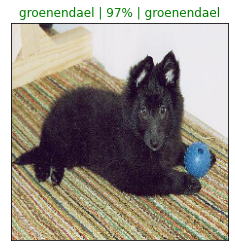

In [89]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top predictions, let's make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`✅
* Find the top 10:
  * Prediction probabilities indexes✅
  * Prediction probabilities values✅
  * Prediction labels✅
* Plot the top 10 prediction probability values and labels, coloring the true label green. ✅

In [129]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

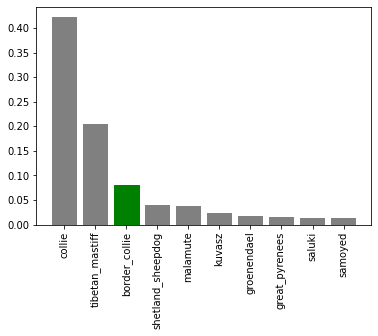

In [130]:
plot_pred_conf(prediction_probabilities= predictions,
              labels= val_labels,
              n=9) 

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

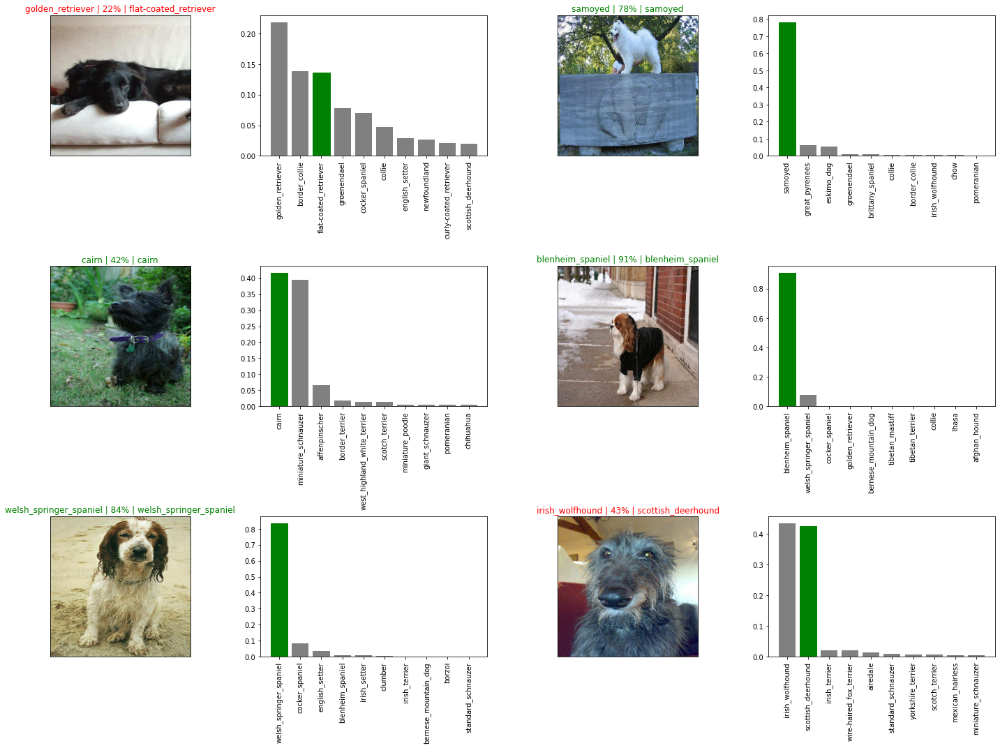

In [140]:
# Let's check out a few predictions and their different values.
i_multiplier = 20
num_rows = 3
num_cols =2
num_images = num_rows*num_cols
plt.figure(figsize = (10* num_cols,5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities= predictions,
            labels= val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities= predictions,
            labels= val_labels,
            n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()
